In [ ]:
! git clone https://github.com/Tessellate-Imaging/Monk_Object_Detection.git

Cloning into 'Monk_Object_Detection'...
remote: Enumerating objects: 10565, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 10565 (delta 17), reused 11 (delta 4), pack-reused 10525
Receiving objects: 100% (10565/10565), 260.88 MiB | 24.41 MiB/s, done.
Resolving deltas: 100% (4709/4709), done.
Checking out files: 100% (8428/8428), done.


In [ ]:
! cd Monk_Object_Detection/1_gluoncv_finetune/installation && cat requirements_colab.txt | xargs -n 1 -L 1 pip install

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 354.0 MB 4.9 kB/s 
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.3 MB 4.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/abhi-kumar/cocoapi.git to /tmp/pip-install-9xp82mb2/pycocotools_530a1ec490e540a9b0fa6aebb1b8e373
  Running command git clone -q https://github.com/abhi-kumar/cocoapi.git /tmp/pip-install-9xp82mb2/pycocotools_530a1ec490e540a9b0fa6aebb1b8e373
  Created wheel for pycocotools: filename=pycocotools-2

In [ ]:
import os
import sys
sys.path.append("Monk_Object_Detection/1_gluoncv_finetune/lib/");

In [ ]:
from inference_prototype import Infer

/usr/local/lib/python3.7/dist-packages/gluoncv/__init__.py:40: UserWarning: Both `mxnet==1.9.0` and `torch==1.12.0+cu113` are installed. You might encounter increased GPU memory footprint if both framework are used at the same time.
  warnings.warn(f'Both `mxnet=={mx.__version__}` and `torch=={torch.__version__}` are installed. '


In [ ]:
! wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1E6T7RKGwy-v1MUxVJm-rxt5XcRyr2SQ7' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1E6T7RKGwy-v1MUxVJm-rxt5XcRyr2SQ7" -O obj_dla_ssd512_trained.zip && rm -rf /tmp/cookies.txt

--2022-08-04 04:56:18--  https://docs.google.com/uc?export=download&id=1E6T7RKGwy-v1MUxVJm-rxt5XcRyr2SQ7
Resolving docs.google.com (docs.google.com)... 64.233.188.101, 64.233.188.102, 64.233.188.100, ...
Connecting to docs.google.com (docs.google.com)|64.233.188.101|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘STDOUT’

-                       [ <=>                ]   2.22K  --.-KB/s    in 0s      

2022-08-04 04:56:18 (36.6 MB/s) - written to stdout [2275]

--2022-08-04 04:56:18--  https://docs.google.com/uc?export=download&confirm=t&id=1E6T7RKGwy-v1MUxVJm-rxt5XcRyr2SQ7
Resolving docs.google.com (docs.google.com)... 64.233.188.100, 64.233.188.139, 64.233.188.138, ...
Connecting to docs.google.com (docs.google.com)|64.233.188.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-00-5o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ep49553mfcnau8nuhs9jq

In [ ]:
! unzip -qq obj_dla_ssd512_trained.zip

In [ ]:
model_name = "ssd_512_vgg16_atrous_coco";
params_file = "dla_ssd512/dla_ssd512-vgg16.params";
class_list = ["paragraph", "heading", "credit", "footer", "drop-capital", "floating", "noise", "article", "header", "caption", "image", "linedrawing", "graphics", "fname", "page-number", "chart", "separator", "table"];

In [ ]:
gtf = Infer(model_name, params_file, class_list, use_gpu=True);

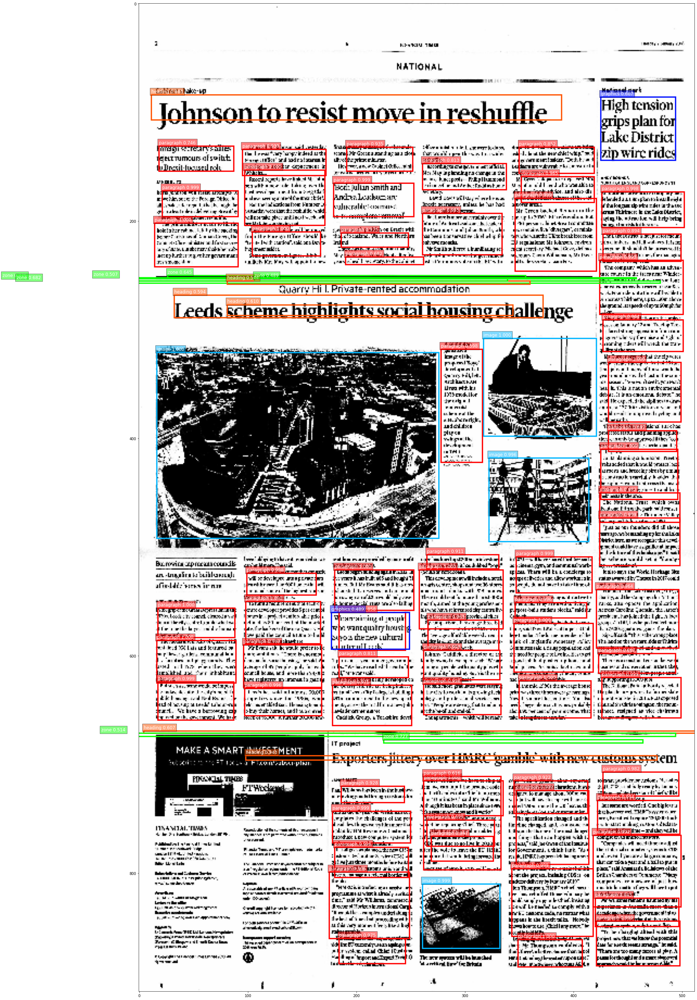

<Figure size 2160x3600 with 0 Axes>

In [ ]:
img_name = "/content/FTDAF0001-C00000-N20180102-00020.jpg"; 
visualize = True;
thresh = 0.3;
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,50)
output = gtf.run(img_name, visualize=visualize, thresh=thresh);

In [ ]:
for k, v in output.items():
  #IDs
  #Scores
  #Boxes
  if k == 'Boxes':
    print(v)


[[[  98.72484    550.7984     167.23811    589.47345  ]
  [ 425.72818    410.8552     496.54868    456.19437  ]
  [  97.53845    153.27191    171.33212    204.99432  ]
  [  14.746918   202.87723     91.42447    242.7724   ]
  [ 317.90067    308.39694    421.74667    398.25052  ]
  [ 349.0473     861.7188     408.05432    886.2005   ]
  [ 432.99023    330.99545    499.23334    385.12228  ]
  [ 104.9976     210.02412    167.47888    232.46465  ]
  [  16.91362    321.1111     276.21118    492.2817   ]
  [ 345.8036     570.7895     418.62897    615.2775   ]
  [ 350.20865    623.35895    416.45547    657.7824   ]
  [ 262.84756    715.43506    335.7161     747.99744  ]
  [ 180.8137     521.2195     253.20021    558.4176   ]
  [ 258.9058     521.8185     335.27542    575.7809   ]
  [  16.15409    586.53296     89.02119    625.6527   ]
  [  17.319164   556.1193      88.35718    583.8581   ]
  [ 346.37283    179.62033    421.13504    246.66107  ]
  [ 343.00787    796.05884    418.3111     858.

In [ ]:
for k, v in output.items():
  #IDs
  #Scores
  #Boxes
  if k == 'IDs':
    print(v)


[[[ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [10.]
  [ 0.]
  [ 0.]
  [ 0.]
  [10.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [10.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [10.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 1.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 1.]
  [ 0.]
  [ 0.]
  [ 6.]
  [ 0.]
  [ 6.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 6.]
  [12.]
  [ 0.]
  [ 6.]
  [ 0.]
  [ 1.]
  [ 1.]
  [ 0.]
  [ 1.]
  [ 1.]
  [ 6.]
  [ 6.]
  [ 6.]
  [12.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]
  [-1.]]]
<NDArray 1x100x1 @cpu(0)>


In [ ]:
img_name = "/content/FTDAF0001-C00000-N20180102-00010.jpg"; 
visualize = True;
thresh = 0.3;
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,50)
output = gtf.run(img_name, visualize=visualize, thresh=thresh);

In [ ]:
img_name = "/content/FTDAF0001-C00000-N20180102-00030.jpg"; 
visualize = True;
thresh = 0.3;
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,50)
output = gtf.run(img_name, visualize=visualize, thresh=thresh);

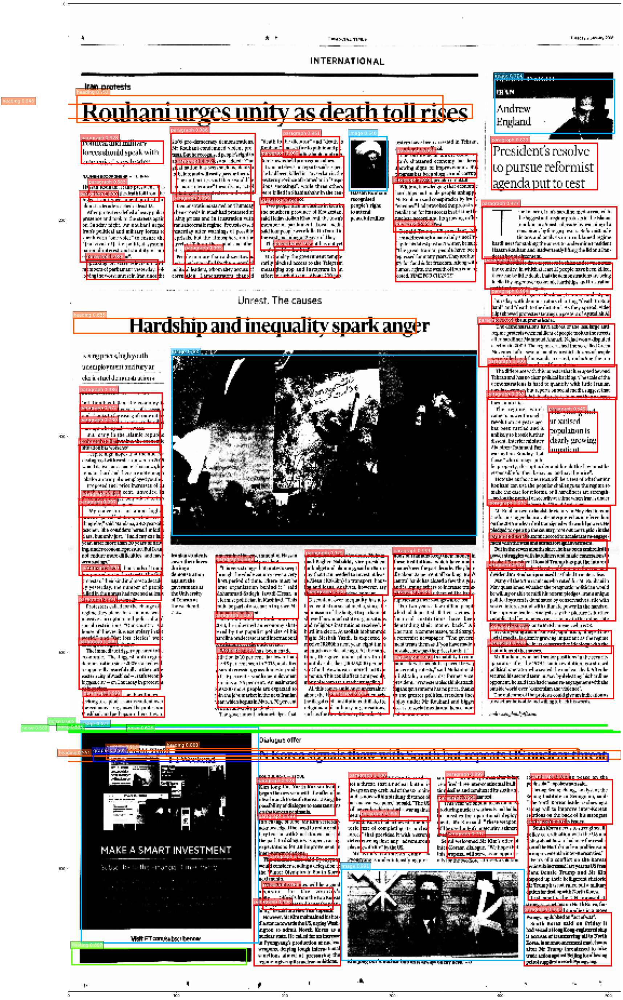

<Figure size 2160x3600 with 0 Axes>

In [ ]:
img_name = "/content/FTDAF0001-C00000-N20180102-00040.jpg"; 
visualize = True;
thresh = 0.5;
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,50)
output = gtf.run(img_name, visualize=visualize, thresh=thresh);

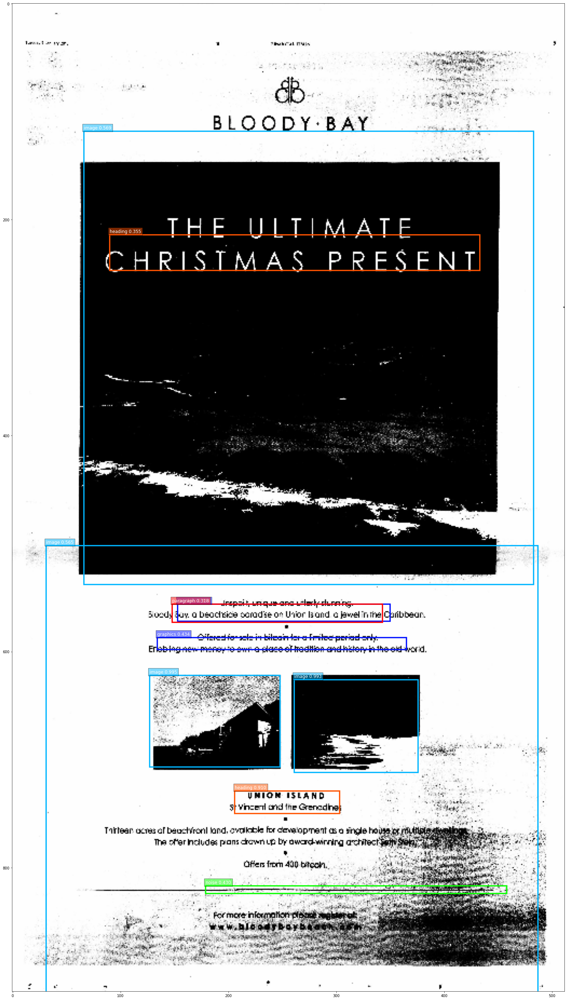

<Figure size 2160x3600 with 0 Axes>

In [ ]:
img_name = "/content/FTDAF0001-C00000-N20180102-00050.jpg"; 
visualize = True;
thresh = 0.3;
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,50)
output = gtf.run(img_name, visualize=visualize, thresh=thresh);

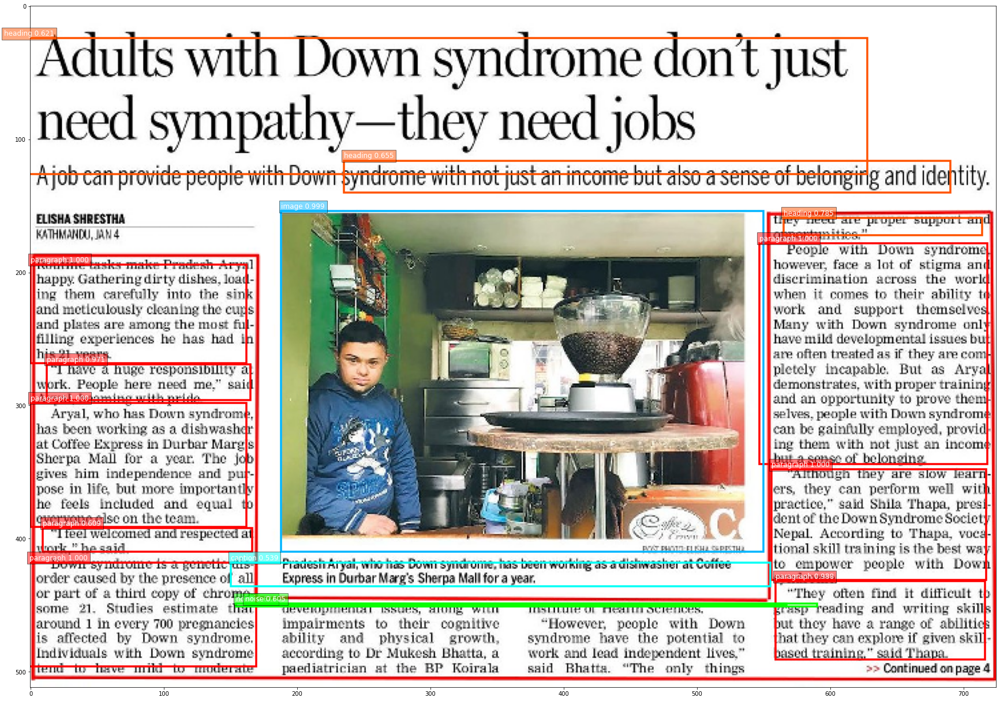

<Figure size 2160x3600 with 0 Axes>

In [ ]:
img_name = "/content/prep.jpg"; 
visualize = True;
thresh = 0.5;
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,50)
output = gtf.run(img_name, visualize=visualize, thresh=thresh);